# Data Visualization Project - Analyzing MLB Pitch Data
## Evan Calkins

In [1]:
# Standard plotly imports
import pandas as pd
import numpy as np
import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode

# Using plotly + cufflinks in offline mode
import cufflinks
cufflinks.go_offline(connected=True)
cufflinks.set_config_file(world_readable=True, theme='pearl')
init_notebook_mode(connected=True)
pd.options.display.max_columns = 30

# Display all cell outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

import plotly
plotly.tools.set_credentials_file(username='ecalkins', api_key='xOlrxmVMUCGKAUZuVgFc')

### Load the data

In [10]:
names = pd.read_csv('mlb-pitch-data-20152018/player_names.csv')
names['batter_id'] = names['id']
names.head()

,id,first_name,last_name,batter_id
0,452657,Jon,Lester,452657
1,425794,Adam,Wainwright,425794
2,457435,Phil,Coke,457435
3,435400,Jason,Motte,435400
4,519166,Neil,Ramirez,519166


In [11]:
pitches = pd.read_csv('mlb-pitch-data-20152018/pitches.csv')
at_bats = pd.read_csv('mlb-pitch-data-20152018/atbats.csv')
pitches.head()

,px,pz,start_speed,end_speed,spin_rate,spin_dir,break_angle,break_length,break_y,ax,ay,az,sz_bot,sz_top,type_confidence,...,nasty,zone,code,type,pitch_type,event_num,b_score,ab_id,b_count,s_count,outs,pitch_num,on_1b,on_2b,on_3b
0,0.416,2.963,92.9,84.1,2305.052,159.235,-25.0,3.2,23.7,7.665,34.685,-11.960,1.72,3.56,2.0,...,55.0,3.0,C,S,FF,3,0.0,2.015000e+09,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,-0.191,2.347,92.8,84.1,2689.935,151.402,-40.7,3.4,23.7,12.043,34.225,-10.085,1.72,3.56,2.0,...,31.0,5.0,S,S,FF,4,0.0,2.015000e+09,0.0,1.0,0.0,2.0,0.0,0.0,0.0
2,-0.518,3.284,94.1,85.2,2647.972,145.125,-43.7,3.7,23.7,14.368,35.276,-11.560,1.72,3.56,2.0,...,49.0,1.0,F,S,FF,5,0.0,2.015000e+09,0.0,2.0,0.0,3.0,0.0,0.0,0.0
3,-0.641,1.221,91.0,84.0,1289.590,169.751,-1.3,5.0,23.8,2.104,28.354,-20.540,1.74,3.35,2.0,...,41.0,13.0,B,B,FF,6,0.0,2.015000e+09,0.0,2.0,0.0,4.0,0.0,0.0,0.0
4,-1.821,2.083,75.4,69.6,1374.569,280.671,18.4,12.0,23.8,-10.280,21.774,-34.111,1.72,3.56,2.0,...,18.0,13.0,B,B,CU,7,0.0,2.015000e+09,1.0,2.0,0.0,5.0,0.0,0.0,0.0


### Data Preparation

In [12]:
pitches2 = pitches.merge(at_bats, on='ab_id')\
    .merge(names, left_on='pitcher_id', right_on='id')

In [486]:
cols = ['ab_id', 'px', 'pz', 'start_speed',
        'spin_rate', 'code', 'type', 'pitch_type',
        'pitcher_id', 'batter_id_y', 'g_id', 'p_throws', 'stand',
        'first_name', 'last_name']
pitches3 = pitches2[cols]
pitches3['name'] = pitches3.first_name + " " + pitches3.last_name
pitches3 = pitches3.drop(columns=['first_name', 'last_name'])

In [71]:
pitches4 = pitches3[pitches3.ab_id >= 2018000000]
strikes = pitches4
strikes['strike'] = (strikes['type'] == 'S') | (strikes['type'] == 'X')
strikes.head()

,ab_id,px,pz,start_speed,spin_rate,code,type,pitch_type,pitcher_id,batter_id_y,g_id,stand,name,strike
9486,2.018000e+09,-0.690714,1.531261,89.8,2175.410,B,B,FF,452657,452657,201800004,R,Jon Lester,False
9487,2.018000e+09,0.185254,1.563559,88.9,2012.128,C,S,FF,452657,452657,201800004,R,Jon Lester,True
9488,2.018000e+09,-0.557172,1.347381,88.2,1830.602,X,X,SI,452657,452657,201800004,R,Jon Lester,True
9489,2.018000e+09,-0.789392,0.653360,90.8,2402.206,B,B,FF,452657,452657,201800004,L,Jon Lester,False
9490,2.018000e+09,0.583114,1.081339,89.0,1962.790,S,S,SI,452657,452657,201800004,L,Jon Lester,True


In [97]:
pitcher_strikes = strikes.groupby(['pitcher_id', 'name'])[['strike']].agg(['mean', 'count']).reset_index()
pitcher_strikes.columns = pitcher_strikes.columns.map('_'.join)
pitcher_strikes2 = pitcher_strikes[pitcher_strikes.strike_count > 100]

In [100]:
k_mean = pitcher_strikes2.strike_mean.mean()
k_sd = np.std(pitcher_strikes2.strike_mean)
print(k_sd)
print(k_mean)

0.03249884617146919

In [79]:
pitcher_strikes2['strike_z'] = (pitcher_strikes2.strike_mean - k_mean)/k_sd
pitcher_avgs = strikes.groupby(['pitcher_id', 'name', 'pitch_type'])[['start_speed']].agg(['mean', 'count']).reset_index()
pitcher_avgs.head()

pitcher_id           name pitch_type start_speed      
                                              mean count
0     112526  Bartolo Colon         CH   80.779839   248
1     112526  Bartolo Colon         FC   85.533871    62
2     112526  Bartolo Colon         FF   89.320000   365
3     112526  Bartolo Colon         FT   86.858243  1389
4     112526  Bartolo Colon         SL   80.471341   164

In [26]:
pitcher_avgs['count_total'] = pitcher_avgs['count'].groupby(pitcher_avgs['pitcher_id']).transform('sum')
pitcher_avgs['percent_thrown'] = pitcher_avgs['count']/pitcher_avgs.count_total
pitcher_avgs2 = pitcher_avgs[pitcher_avgs.percent_thrown >= 0.05]

In [33]:
speed_numtypes = pitcher_avgs2.groupby(['name', 'pitcher_id'])['mean'].agg(['max', 'count']).reset_index()
speed_numtypes.head()

,name,pitcher_id,max,count
0,A.J. Cole,595918,94.002198,4
1,A.J. Minter,621345,96.565941,2
2,AJ Ramos,573109,91.664634,6
3,Aaron Brooks,605156,92.200000,5
4,Aaron Bummer,607481,93.094169,3


In [108]:
fipk9 = stats2018[['Name', 'K/9', 'FIP']]

In [109]:
speed_strikes = speed_numtypes.merge(pitcher_strikes2, how='inner', left_on='pitcher_id', right_on='pitcher_id_') \
        .merge(fipk9, how='inner', left_on='name', right_on='Name')
speed_strikes.head()

,name,pitcher_id,max,count,pitcher_id_,name_,strike_mean,strike_count,strike_z,Name,K/9,FIP
0,A.J. Cole,595918,94.002198,4,595918,A.J. Cole,0.634396,878,0.221802,A.J. Cole,10.99,6.12
1,A.J. Minter,621345,96.565941,2,621345,A.J. Minter,0.639657,1049,0.383668,A.J. Minter,10.13,2.72
2,Aaron Bummer,607481,93.094169,3,607481,Aaron Bummer,0.602627,609,-0.755743,Aaron Bummer,9.95,2.40
3,Aaron Loup,571901,91.963090,4,571901,Aaron Loup,0.656863,714,0.913100,Aaron Loup,9.98,3.61
4,Aaron Nola,605400,92.745322,4,605400,Aaron Nola,0.671531,3221,1.364434,Aaron Nola,9.49,3.01


In [59]:
#defined below
fipk9 = stats2018[['Name', 'K/9', 'FIP']]
speed_numtypes2 = speed_numtypes.merge(fipk9, how='inner', left_on='name', right_on='Name')
speed_numtypes2.head()

,name,pitcher_id,max,count,Name,K/9,FIP
0,A.J. Cole,595918,94.002198,4,A.J. Cole,10.99,6.12
1,A.J. Minter,621345,96.565941,2,A.J. Minter,10.13,2.72
2,Aaron Bummer,607481,93.094169,3,Aaron Bummer,9.95,2.40
3,Aaron Loup,571901,91.963090,4,Aaron Loup,9.98,3.61
4,Aaron Nola,605400,92.745322,4,Aaron Nola,9.49,3.01


### Scatterplot

In [788]:
df = speed_strikes

trace1 = go.Scatter(
    x=df['max'],
    y=df['FIP'],
    text=df['name'] + '<br>Strikes thrown: ' + round(df['strike_mean']*100).astype(int).astype(str)+'%',
    mode='markers',
    marker=dict(
        size=8,
        color = df['strike_z'], #set color equal to a variable
        colorscale='Viridis',
        colorbar=dict(
                title='%Strikes Thrown<br>(SD from mean)'
            ),
        showscale=True
    )
)

layout= go.Layout(
    title= 'Impact of Fastball Velocity & Strike Percentage on FIP - 2018 Season',
    hovermode= 'closest',
    xaxis= dict(
        title= "Pitcher's Average Fastball Velocity (mph)",
        ticklen= 5,
        zeroline= False,
        gridwidth= 2,
    ),
    yaxis=dict(
        title= 'Fielding Indepdepent Pitching (Runs/9IP)',
        ticklen= 5,
        gridwidth= 2,
    ),
    showlegend= False,
    paper_bgcolor='rgb(255,255,255)',
    plot_bgcolor='rgb(229,229,229)',
    #plot_bgcolor='lightgray'
    #plot_bgcolor:"black",
    #paper_bgcolor:"#FFF3"
)


fig= go.Figure(data=[trace1], layout=layout)

py.iplot(fig, filename='FIP vs Velocity & Strike Percentage')

### Additional Scatterplots (not included in report)

In [57]:
df = speed_numtypes2

fig = {
    'data': [
        {
            'x': df[df['count']==num_pitches]['max'],
            'y': df[df['count']==num_pitches]['K/9'],
            'name': num_pitches,
            'text': df[df['count']==num_pitches]['name'],
            'mode': 'markers',
        } for num_pitches in [2, 3, 4, 5, 6]
    ],
    'layout': {
        'xaxis': {'title': 'Pitch Velocity'},
        'yaxis': {'title': "Strikeouts per 9 IP"}
    }
}

py.iplot(fig)

In [62]:
df = speed_numtypes2

fig = {
    'data': [
        {
            'x': df[df['count']==num_pitches]['max'],
            'y': df[df['count']==num_pitches]['FIP'],
            'name': num_pitches,
            'text': df[df['count']==num_pitches]['name'],
            'mode': 'markers',
        } for num_pitches in [2, 3, 4, 5, 6]
    ],
    'layout': {
        'xaxis': {'title': 'Pitch Velocity'},
        'yaxis': {'title': "FIP"}
    }
}

iplot(fig)

In [ ]:
x = speed_numtypes2['max']
y = speed_numtypes2['K/9']

trace = go.Scatter(
    x = x,
    y = y,
    mode = 'markers'
)

data = [trace]

# Plot and embed in ipython notebook!
py.iplot(data, filename='basic-scatter')

# or plot with: plot_url = py.plot(data, filename='basic-line')

In [69]:
pitcher_avgs = pitcher_avgs[pitcher_avgs['count'] > 15]
pitcher_avgs.shape

(5047, 5)

In [70]:
ff = pitcher_avgs[pitcher_avgs.pitch_type == 'FF'][['mean', 'name']]
ft = pitcher_avgs[pitcher_avgs.pitch_type == 'FT'][['mean', 'name']]
fc = pitcher_avgs[pitcher_avgs.pitch_type == 'FC'][['mean', 'name']]
fs = pitcher_avgs[pitcher_avgs.pitch_type == 'FS'][['mean', 'name']]
sl = pitcher_avgs[pitcher_avgs.pitch_type == 'SL'][['mean', 'name']]
ch = pitcher_avgs[pitcher_avgs.pitch_type == 'CH'][['mean', 'name']]
si = pitcher_avgs[pitcher_avgs.pitch_type == 'SI'][['mean', 'name']]
cu = pitcher_avgs[pitcher_avgs.pitch_type == 'CU'][['mean', 'name']]
kn = pitcher_avgs[pitcher_avgs.pitch_type == 'KN'][['mean', 'name']]
ep = pitcher_avgs[pitcher_avgs.pitch_type == 'EP'][['mean', 'name']]

### Boxplot

In [104]:
import plotly.plotly as py
import plotly.graph_objs as go

x_data = ['fastball-4s', 'fastball-2s',
          'sinker', 'cutter', 'slider',
          'changeup', 'splitter', 'curveball']


p_data = [ff, ft, si, fc, fs, sl, ch, cu, kn]

y_data = [x['mean'] for x in p_data]

labels = [x['name'] for x in p_data]
traces = []

for xd, yd, ld in zip(x_data, y_data, labels):
#for xd, yd, cls in zip(x_data, y_data, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints='all',
            jitter=0.5,
            whiskerwidth=0.2,
            #fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
            text=ld
        ))

layout = go.Layout(
    title='Velocity Distribution by Pitch Type - Pitcher Average',
    yaxis=dict(
        title='Velocity (mph)',
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=5,
        gridcolor='rgb(255, 255, 255)',
        gridwidth=1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    xaxis=dict(
        title='Pitch Type',
        tickangle=0
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=False
)


fig = go.Figure(data=traces, layout=layout)
iplot(fig)
#py.iplot(fig, filename='baseball_boxplot')

In [882]:
ff = pitches3[pitches3.pitch_type == 'FF'][['start_speed', 'name']]
pitch_count = pitches.groupby('pitch_type')['px'].count().reset_index()
pitch_count.head()

,pitch_type,px
0,AB,9
1,CH,292789
2,CU,234391
3,EP,815
4,FA,9


In [883]:
pitch_count.columns = ['pitch_type', 'count']
pitch_count.head()

,pitch_type,count
0,AB,9
1,CH,292789
2,CU,234391
3,EP,815
4,FA,9


In [890]:
y = pitch_count['pitch_type'].values
x = pitch_count['count'].values
sortx = sorted(x, reverse=False)[-10:]
sortx

[11260, 43705, 66484, 149756, 234391, 242504, 292789, 337983, 450578, 1014877]

In [906]:
y = pitch_count['pitch_type'].values
x = pitch_count['count'].values
sortx = sorted(x, reverse=False)[-10:]
sorty = [y for _,y in sorted(zip(x,y), reverse=False)][-10:]
ynames = ['Fastball-4S', 'Slider', 'Fastball-2S', 'Changeup', 'Sinker',
         'Curveball', 'Cutter', 'Knuckle Curve', 'Splitter', 'Knuckle Ball']
ynames = list(reversed(ynames))

data = [go.Bar(
            x=sortx,
            y=ynames,
            orientation='h'
    )]
layout = go.Layout(
    title='Number of Pitches Thrown by Pitch Type - 2018 Season',
    yaxis=dict(
        title='Type of Pitch',
    ),
    xaxis=dict(
        title='Pitches Thrown',
        tickangle=0
    ),
    margin=dict(
        l=200,
        r=30,
        b=80,
        t=75,
    ),
    paper_bgcolor='rgb(243, 243, 243)',
    plot_bgcolor='rgb(243, 243, 243)',
    showlegend=False
)

fig = go.Figure(data=data, layout=layout)

py.iplot(fig, name='Pitches by Pitch Type')

In [784]:
sliders = pitches.loc[pitches.pitch_type == 'SL']['start_speed'].values
twoseam = pitches.loc[pitches.pitch_type == 'CU']['start_speed'].values

trace1 = go.Histogram(
    x=sliders,
    opacity=0.75,
    nbinsx=100,
    name='Slider'
)
trace2 = go.Histogram(
    x=twoseam,
    opacity=0.75,
    nbinsx=100,
    name='Curve'
)

data = [trace1, trace2]
layout = go.Layout(barmode='overlay', title='2018 MLB Pitch Velocity Distribution', xaxis=dict(
        title='Velocity (mph)'
    ),
    yaxis=dict(
        title='Count of Pitches'
    ))

fig = go.Figure(data=data, layout=layout)
iplot(fig)

In [810]:
idx = pitches.groupby('ab_id')['pitch_num'].transform(max) == pitches['pitch_num']

In [811]:
last_pitch = pitches[idx]

In [812]:
last_pitch = last_pitch.merge(at_bats, on='ab_id')
last_pitch.shape

(740241, 51)

In [827]:
last_pitch2 = last_pitch[['g_id', 'ab_id', 'px', 'pz', 'start_speed',
                          'spin_rate', 'code', 'type', 'pitch_type',
                          'batter_id', 'event', 'stand']]
hr_pitch = last_pitch2[last_pitch2.event == 'Home Run']
hr_pitch = hr_pitch.merge(games[['g_id', 'date']], on='g_id')
hr_pitch['month'] = hr_pitch['date'].map(lambda x: x.split('-')[1])
hr_pitch.head()

,g_id,ab_id,px,pz,start_speed,spin_rate,code,type,pitch_type,batter_id,event,stand,date,month
0,201800001,2.018000e+09,-0.039165,2.025936,90.9,1238.547,E,X,FC,594777,Home Run,L,2018-03-29,03
1,201800001,2.018000e+09,-0.256755,3.028826,91.7,2130.731,E,X,SI,446359,Home Run,R,2018-03-29,03
2,201800001,2.018000e+09,0.535546,2.377175,96.9,2111.180,E,X,FT,501981,Home Run,R,2018-03-29,03
3,201800001,2.018000e+09,0.291856,2.632473,90.8,168.726,E,X,SL,621566,Home Run,L,2018-03-29,03
4,201800001,2.018000e+09,0.110957,3.220406,92.3,2372.537,E,X,SI,405395,Home Run,R,2018-03-29,03


In [833]:
ptypes = ['FF', 'SL', 'FT', 'CH', 'SI', 'CU']
hr_pitch2 = hr_pitch[hr_pitch.pitch_type.isin(ptypes)]
hr_pitch3 = hr_pitch2.groupby(['month', 'pitch_type'])['g_id'].count().reset_index()
hr_pitch3.rename(columns={'g_id':'hr_count'}, inplace=True)
hr_pitch3['month'] = hr_pitch3.month.astype(int)

In [855]:
hr_pitch4 = hr_pitch3.pivot('month', 'pitch_type', 'hr_count').reset_index().iloc[1:7,:]

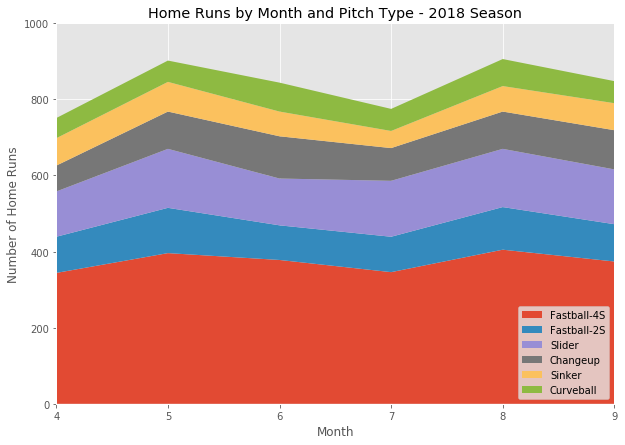

In [880]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
 
# Data
x=range(1,6)
y=[ [1,4,6,8,9], [2,2,7,10,12], [2,8,5,10,6] ]
y = [list(hr_pitch4.FF), list(hr_pitch4.FT), list(hr_pitch4.SL), list(hr_pitch4.CH), list(hr_pitch4.SI), list(hr_pitch4.CU)]
labels=['Fastball-4S','Fastball-2S', 'Slider', 'Changeup', 'Sinker', 'Curveball']

# Plot

import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(10,7))
_ = ax.set_title("Home Runs by Month and Pitch Type - 2018 Season")
_ = ax.stackplot(hr_pitch4.month, y, labels=labels)
_ = ax.set_ylim([0,1000])
_ = ax.set_xlim([4,9])
_ = ax.set_xlabel('Month')
_ = ax.set_ylabel('Number of Home Runs')
_ = plt.legend(loc='lower right')
plt.show()

In [126]:
# Looking at spin rate
# May do something with this later
cutters = last_pitch3[last_pitch3.pitch_type=='FC'].groupby('event')[['start_speed', 'spin_rate']].mean()
curves = last_pitch3[last_pitch3.pitch_type=='CU'].groupby('event')[['start_speed', 'spin_rate']].mean()
curves

,start_speed,spin_rate
event,,
Double,77.854325,1233.885699
Flyout,77.668707,1199.984278
Groundout,78.037745,1317.076803
Home Run,77.417565,1184.112162
Lineout,77.867731,1243.576555
Pop Out,77.451159,1173.719931
Single,78.037371,1270.885913
Strikeout,79.020887,1306.189003
Triple,78.119910,1189.410394


In [127]:
sliders = last_pitch3[last_pitch3.pitch_type=='SL'].groupby('event')[['start_speed', 'spin_rate']].mean()
sliders

,start_speed,spin_rate
event,,
Double,84.244403,762.765361
Flyout,84.164443,805.872757
Groundout,84.859861,776.138602
Home Run,84.081085,791.860453
Lineout,84.484391,786.682453
Pop Out,83.952501,832.744351
Single,84.613519,780.717247
Strikeout,84.684683,795.667905
Triple,84.872292,792.595217


In [128]:
sliders = last_pitch3[last_pitch3.pitch_type=='FF'].groupby('event')[['start_speed', 'spin_rate']].mean()
sliders

,start_speed,spin_rate
event,,
Double,92.654518,2123.947499
Flyout,92.595987,2177.193398
Groundout,92.983978,2070.753681
Home Run,92.392979,2164.658124
Lineout,92.804300,2130.001667
Pop Out,92.598694,2193.410285
Single,92.888634,2108.330124
Strikeout,93.700289,2199.332360
Triple,92.542474,2114.156400


### Heatmap - Storyline

In [488]:
pitches4.head()

,ab_id,px,pz,start_speed,spin_rate,code,type,pitch_type,pitcher_id,batter_id_y,g_id,p_throws,stand,name
9486,2.018000e+09,-0.690714,1.531261,89.8,2175.410,B,B,FF,452657,452657,201800004,L,R,Jon Lester
9487,2.018000e+09,0.185254,1.563559,88.9,2012.128,C,S,FF,452657,452657,201800004,L,R,Jon Lester
9488,2.018000e+09,-0.557172,1.347381,88.2,1830.602,X,X,SI,452657,452657,201800004,L,R,Jon Lester
9489,2.018000e+09,-0.789392,0.653360,90.8,2402.206,B,B,FF,452657,452657,201800004,L,L,Jon Lester
9490,2.018000e+09,0.583114,1.081339,89.0,1962.790,S,S,SI,452657,452657,201800004,L,L,Jon Lester


In [489]:
pitches2018 = pitches4.merge(at_bats[['ab_id', 'pitcher_id', 'batter_id', 'event']], how='left', on='ab_id')

In [676]:
# Filter for pitchers who threw at least 50 IP
stats2018_2 = stats2018[stats2018.IP > 50]

# print 0.05 and 0.95 quantiles for FIP
upper_quant = np.quantile(stats2018_2.FIP, 0.85)
lower_quant = np.quantile(stats2018_2.FIP, 0.15)
print(upper_quant)
print(lower_quant)

4.906999999999999
3.041


In [677]:
stats2018_2['pitch'] = 1
aces = stats2018_2[stats2018_2['FIP'] <= lower_quant]
donkeys = stats2018_2[stats2018_2['FIP'] >= upper_quant]
aces.head()

,Name,Team,W,L,SV,G,GS,IP,K/9,BB/9,HR/9,BABIP,LOB%,GB%,HR/FB,ERA,FIP,xFIP,WAR,playerid,pitch
0,Jacob deGrom,Mets,10,9,0,32,32,217.0,11.16,1.91,0.41,0.281,82.0 %,46.4 %,6.3 %,1.70,1.99,2.60,9.0,10954,1
1,Max Scherzer,Nationals,18,7,0,33,33,220.2,12.24,2.08,0.94,0.265,81.3 %,34.3 %,9.7 %,2.53,2.65,3.06,7.4,3137,1
2,Justin Verlander,Astros,16,9,0,34,34,214.0,12.20,1.56,1.18,0.272,85.3 %,29.1 %,11.1 %,2.52,2.78,3.03,6.7,8700,1
3,Chris Sale,Red Sox,12,4,0,27,27,158.0,13.50,1.94,0.63,0.283,82.5 %,44.2 %,9.3 %,2.11,1.98,2.31,6.2,10603,1
4,Gerrit Cole,Astros,15,5,0,32,32,200.1,12.40,2.88,0.85,0.286,77.9 %,36.0 %,10.0 %,2.88,2.70,3.04,6.0,13125,1


In [678]:
ace_pitches = pitches2018.merge(aces, how='inner', left_on='name', right_on='Name')
donkey_pitches = pitches2018.merge(donkeys, how='inner', left_on='name', right_on='Name')

In [679]:
ace_pitchesL = ace_pitches[ace_pitches['p_throws'] == 'L']
ace_pitchesR = ace_pitches[ace_pitches['p_throws'] == 'R']
donkey_pitchesL = donkey_pitches[donkey_pitches['p_throws'] == 'L']
donkey_pitchesR = donkey_pitches[donkey_pitches['p_throws'] == 'R']

In [680]:
ace_pitchesLL = ace_pitches[(ace_pitches['p_throws'] == 'L') & (ace_pitches['stand'] == 'L')]
ace_pitchesLR = ace_pitches[(ace_pitches['p_throws'] == 'L') & (ace_pitches['stand'] == 'R')]
ace_pitchesRL = ace_pitches[(ace_pitches['p_throws'] == 'R') & (ace_pitches['stand'] == 'L')]
ace_pitchesRR = ace_pitches[(ace_pitches['p_throws'] == 'R') & (ace_pitches['stand'] == 'R')]
donkey_pitchesLL = donkey_pitches[(donkey_pitches['p_throws'] == 'L') & (donkey_pitches['stand'] == 'L')]
donkey_pitchesLR = donkey_pitches[(donkey_pitches['p_throws'] == 'L') & (donkey_pitches['stand'] == 'R')]
donkey_pitchesRL = donkey_pitches[(donkey_pitches['p_throws'] == 'R') & (donkey_pitches['stand'] == 'L')]
donkey_pitchesRR = donkey_pitches[(donkey_pitches['p_throws'] == 'R') & (donkey_pitches['stand'] == 'R')]

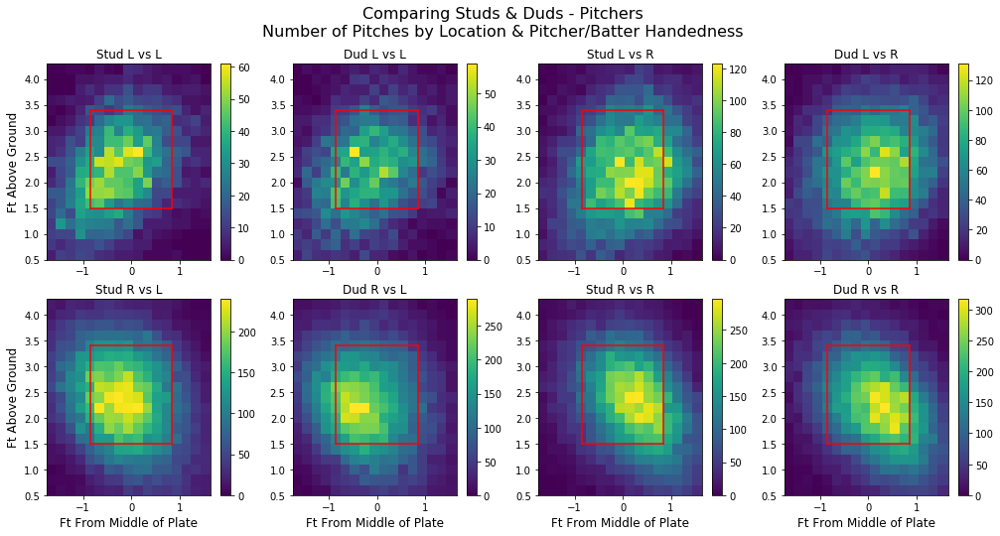

In [704]:
def plot_k_zone(ax):
    x1 = np.linspace(-.849, -.849)
    x2 = np.linspace(.849, .849)
    x = np.linspace(-.849, .849)
    y1 = np.linspace(1.5,1.5)
    y2 = np.linspace(3.4, 3.4)
    y = np.linspace(1.5, 3.4)
    ax.plot(x1, y, color="r")
    ax.plot(x2, y, color="r")
    ax.plot(x, y1, color="r")
    ax.plot(x, y2, color="r")

def plot_zone(ax, df, title, binsize=0.2, xlabel=None, ylabel=None, fontsize=12):
    ax.plot()
    counts, xedges, yedges, im = ax.hist2d(df.px, df.pz, bins=[np.arange(-1.75, 1.75, binsize), np.arange(.5, 4.5, binsize)],
              weights=df.pitch)
    plt.colorbar(im, ax=ax)
    if xlabel is not None:
        ax.set_xlabel(xlabel, fontsize=fontsize)
    if ylabel is not None:
        ax.set_ylabel(ylabel, fontsize=fontsize)
    ax.set_title(title, fontsize=fontsize)
    plot_k_zone(ax)
    

fig = plt.figure()
fig.set_figheight(8)
fig.set_figwidth(17)
_ = fig.suptitle('Comparing Studs & Duds - Pitchers\nNumber of Pitches by Location & Pitcher/Batter Handedness', fontsize=16)

ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)
ax8 = fig.add_subplot(2,4,8)

plot_zone(ax=ax1, df=ace_pitchesLL, title='Stud L vs L', ylabel='Ft Above Ground')
plot_zone(ax=ax3, df=ace_pitchesLR, title='Stud L vs R')
plot_zone(ax=ax5, df=ace_pitchesRL, title='Stud R vs L', ylabel='Ft Above Ground', xlabel='Ft From Middle of Plate')
plot_zone(ax=ax7, df=ace_pitchesRR, title='Stud R vs R', xlabel='Ft From Middle of Plate')
plot_zone(ax=ax2, df=donkey_pitchesLL, title='Dud L vs L')
plot_zone(ax=ax4, df=donkey_pitchesLR, title='Dud L vs R')
plot_zone(ax=ax6, df=donkey_pitchesRL, title='Dud R vs L', xlabel='Ft From Middle of Plate')
plot_zone(ax=ax8, df=donkey_pitchesRR, title='Dud R vs R', xlabel='Ft From Middle of Plate')

### Map visualizations

In [43]:
stats2018 = pd.read_csv('mlb-pitch-data-20152018/pitcher_stats2018.csv')
stats2018.head()

,Name,Team,W,L,SV,G,GS,IP,K/9,BB/9,HR/9,BABIP,LOB%,GB%,HR/FB,ERA,FIP,xFIP,WAR,playerid
0,Jacob deGrom,Mets,10,9,0,32,32,217.0,11.16,1.91,0.41,0.281,82.0 %,46.4 %,6.3 %,1.70,1.99,2.60,9.0,10954
1,Max Scherzer,Nationals,18,7,0,33,33,220.2,12.24,2.08,0.94,0.265,81.3 %,34.3 %,9.7 %,2.53,2.65,3.06,7.4,3137
2,Justin Verlander,Astros,16,9,0,34,34,214.0,12.20,1.56,1.18,0.272,85.3 %,29.1 %,11.1 %,2.52,2.78,3.03,6.7,8700
3,Chris Sale,Red Sox,12,4,0,27,27,158.0,13.50,1.94,0.63,0.283,82.5 %,44.2 %,9.3 %,2.11,1.98,2.31,6.2,10603
4,Gerrit Cole,Astros,15,5,0,32,32,200.1,12.40,2.88,0.85,0.286,77.9 %,36.0 %,10.0 %,2.88,2.70,3.04,6.0,13125


In [377]:
games = pd.read_csv('data/games.csv')
games['venue_name'].loc[games.venue_name == 'Angel Stadium'] = 'Angel Stadium of Anaheim'
games.head()

,attendance,away_final_score,away_team,date,elapsed_time,g_id,home_final_score,home_team,start_time,umpire_1B,umpire_2B,umpire_3B,umpire_HP,venue_name,weather,wind,delay
0,35055,3,sln,2015-04-05,184,201500001,0,chn,7:17 PM,Mark Wegner,Marty Foster,Mike Muchlinski,Mike Winters,Wrigley Field,"44 degrees, clear","7 mph, In from CF",0
1,45909,1,ana,2015-04-06,153,201500002,4,sea,1:12 PM,Ron Kulpa,Brian Knight,Vic Carapazza,Larry Vanover,Safeco Field,"54 degrees, cloudy","1 mph, Varies",0
2,36969,2,atl,2015-04-06,156,201500003,1,mia,4:22 PM,Laz Diaz,Chris Guccione,Cory Blaser,Jeff Nelson,Marlins Park,"80 degrees, partly cloudy","16 mph, In from CF",16
3,31042,6,bal,2015-04-06,181,201500004,2,tba,3:12 PM,Ed Hickox,Paul Nauert,Mike Estabrook,Dana DeMuth,Tropicana Field,"72 degrees, dome","0 mph, None",0
4,45549,8,bos,2015-04-06,181,201500005,0,phi,3:08 PM,Phil Cuzzi,Tony Randazzo,Will Little,Gerry Davis,Citizens Bank Park,"71 degrees, partly cloudy","11 mph, Out to RF",0


In [378]:
team_names = {
    'chn' : 'Chicaco Cubs','sea':'Seattle Mariners', 'mia': 'Miami Marlins',
    'tba':'Tampa Bay Rays', 'phi':'Philadelphia Phillies', 'sdn':'San Diego Padres',
    'col':'Colorado Rockies', 'bal':'Baltimore Orioles', 'atl':'Atlanta Braves',
    'ana':'Los Angeles Angels of Anaheim', 'tor':'Toronto Blue Jays', 'tex':'Texas Rangers',
    'sfn':'San Francisco Giants', 'ari':'Arizona Diamondbacks', 'mil':'Milwaukee Brewers',
    'lan':'Los Angeles Dodgers', 'nya':'New York Yankees', 'nyn':'New York Mets',
    'oak':'Oakland Athletics', 'cin':'Cincinnati Reds', 'was':'Washington Nationals',
    'det':'Detroit Tigers', 'hou':'Houston Tigers', 'kca':'Kansas City Royals',
    'pit':'Pittsburgh Pirates', 'min':'Minnesota Twins', 'cle':'Cleveland Indians',
    'cha':'Chicago White Sox', 'bos':'Boston Red Sox', 'sln':'St. Louis Cardinals'
}

In [380]:
games['home_team_name'] = games['home_team'].apply(lambda x : team_names[x])
games['away_team_name'] = games['away_team'].apply(lambda x : team_names[x])
games.head()

,attendance,away_final_score,away_team,date,elapsed_time,g_id,home_final_score,home_team,start_time,umpire_1B,umpire_2B,umpire_3B,umpire_HP,venue_name,weather,wind,delay,home_team_name,away_team_name
0,35055,3,sln,2015-04-05,184,201500001,0,chn,7:17 PM,Mark Wegner,Marty Foster,Mike Muchlinski,Mike Winters,Wrigley Field,"44 degrees, clear","7 mph, In from CF",0,Chicaco Cubs,St. Louis Cardinals
1,45909,1,ana,2015-04-06,153,201500002,4,sea,1:12 PM,Ron Kulpa,Brian Knight,Vic Carapazza,Larry Vanover,Safeco Field,"54 degrees, cloudy","1 mph, Varies",0,Seattle Mariners,Los Angeles Angels of Anaheim
2,36969,2,atl,2015-04-06,156,201500003,1,mia,4:22 PM,Laz Diaz,Chris Guccione,Cory Blaser,Jeff Nelson,Marlins Park,"80 degrees, partly cloudy","16 mph, In from CF",16,Miami Marlins,Atlanta Braves
3,31042,6,bal,2015-04-06,181,201500004,2,tba,3:12 PM,Ed Hickox,Paul Nauert,Mike Estabrook,Dana DeMuth,Tropicana Field,"72 degrees, dome","0 mph, None",0,Tampa Bay Rays,Baltimore Orioles
4,45549,8,bos,2015-04-06,181,201500005,0,phi,3:08 PM,Phil Cuzzi,Tony Randazzo,Will Little,Gerry Davis,Citizens Bank Park,"71 degrees, partly cloudy","11 mph, Out to RF",0,Philadelphia Phillies,Boston Red Sox


In [382]:
stadiums = pd.read_csv('data/MLB_Stadiums.csv', thousands=',')
stadiums['Stadium Name'].loc[stadiums['Stadium Name'] == 'O.co Coliseum'] = 'Oakland Coliseum'
stadiums['Stadium Name'].loc[stadiums['Stadium Name'] == 'Turner Field'] = 'SunTrust Park'
stadiums['Stadium Name'].loc[stadiums['Stadium Name'] == 'U.S. Cellular Field'] = 'Guaranteed Rate Field'
stadiums.head()

,Team Name,Stadium Name,City,Latitude,Longitude,total_attendance,avg_attendance,Allstars,Payroll
0,Arizona Diamondbacks,Chase Field,"Phoenix, AZ",33.445526,-112.066721,2242695.0,27688.0,3.0,"$134,850,600"
1,Atlanta Braves,SunTrust Park,"Atlanta, GA",33.734805,-84.389996,2555781.0,31553.0,4.0,"$115,848,667"
2,Baltimore Orioles,Oriole Park at Camden Yards,"Baltimore, MD",39.283964,-76.621618,1564192.0,19311.0,1.0,"$141,555,833"
3,Boston Red Sox,Fenway Park,"Boston, MA",42.346619,-71.096961,2895575.0,35748.0,5.0,"$222,205,000"
4,Chicago Cubs,Wrigley Field,"Chicago, IL",41.947856,-87.655887,3181089.0,38794.0,3.0,"$205,373,881"


In [385]:
games = games[games.date > '2018-01-01']
games2 = games.merge(stadiums, how='left', left_on="venue_name", right_on="Stadium Name")
games2 = games2[games2['avg_attendance'].isna() == False]

# check if got all stadiums
sum(games2['venue_name'].isna())

0

In [844]:
at_bats['is_hr'] = at_bats['event'] == 'Home Run'
hrs = at_bats.groupby('g_id')['is_hr'].sum().reset_index()
hrs.rename(columns = {'is_hr':'hr_count'}, inplace = True)
games3 = games2.merge(hrs, on='g_id')

In [302]:
hrs_by_stadium = games3.groupby(['venue_name', 'avg_attendance', 'City', 'Latitude', 'Longitude'])['hr_count'].sum().reset_index()
hrs_by_stadium.rename(columns={'hr_count':'2018_hrs'}, inplace=True)
mean_hrs = np.mean(hrs_by_stadium['2018_hrs'])
std_hrs = np.std(hrs_by_stadium['2018_hrs'])
hrs_by_stadium['hrs_z'] = (hrs_by_stadium['2018_hrs'] - mean_hrs) / std_hrs
hrs_by_stadium.head()

,venue_name,avg_attendance,City,Latitude,Longitude,2018_hrs,hrs_z
0,AT&T Park,38965.0,"San Francisco, CA",37.778473,-122.389595,124.0,-1.954531
1,Angel Stadium of Anaheim,37287.0,"Anaheim, CA",33.799925,-117.883194,223.0,1.179895
2,Busch Stadium,42020.0,"St. Louis, MO",38.622317,-90.193891,161.0,-0.783079
3,Chase Field,27688.0,"Phoenix, AZ",33.445526,-112.066721,171.0,-0.466470
4,Citi Field,27469.0,"New York, NY",40.756337,-73.846043,167.0,-0.593113


### Bubble Map

In [783]:
colorscale=[[0.0, 'rgb(165,0,38)'], [0.1111111111111111, 'rgb(215,48,39)'], [0.2222222222222222, 'rgb(244,109,67)'], [0.3333333333333333, 'rgb(253,174,97)'], [0.4444444444444444, 'rgb(254,224,144)'], [0.5555555555555556, 'rgb(224,243,248)'], [0.6666666666666666, 'rgb(171,217,233)'], [0.7777777777777778, 'rgb(116,173,209)'], [0.8888888888888888, 'rgb(69,117,180)'], [1.0, 'rgb(49,54,149)']]

data = go.Scattergeo(
    locationmode = 'USA-states',
    lon = hrs_by_stadium['Longitude'],
    lat = hrs_by_stadium['Latitude'],
    text = hrs_by_stadium['venue_name'] + '<br>' + 'Avg Attendance: ' +
        hrs_by_stadium['avg_attendance'].astype(int).astype(str)+
        '<br>Total HR: ' + hrs_by_stadium['2018_hrs'].astype(int).astype(str),
    marker = go.scattergeo.Marker(
        size = hrs_by_stadium['avg_attendance'],
        color = hrs_by_stadium['hrs_z'],

        colorscale=colorscale,
        colorbar=dict(
                title='Home runs<br>(SD from mean)'
            ),
        showscale=True,
        sizeref=100,
        sizemode = 'area'
    ))
    
layout = go.Layout(
        title = go.layout.Title(
            text = 'MLB Stadiums by 2018 Home Runs & Avg Attendance<br>(Hover for attendance numbers)'
        ),
        geo = go.layout.Geo(
            landcolor='gray',
            scope = 'usa',
            projection = go.layout.geo.Projection(
                type='albers usa'
            ),
            showland = True,
            #landcolor = 'rgb(217, 217, 217)',
            subunitwidth=1,
            countrywidth=1,
            subunitcolor="rgb(255, 255, 255)",
            countrycolor="rgb(255, 255, 255)"
        )
    )

fig = go.Figure(data=[data], layout=layout)
py.iplot(fig, filename='MLB Stadiums HR & Attendance')

### Chloropeth

In [339]:
prospects = pd.read_csv('data/mlb_prospects.csv')
prospects.head()

,MLB Rank,Tm Rank,Player Name,Pos,Team Name,Ht,Wt,B-T,BornDate,Age,Place,HiLvl,Stat Years,MLB Years,Draft Information,Status,Current Org (Level),Debut
0,1.0,-,Vladimir Guerrero,OF,Toronto Blue Jays,1-Jun,200.0,R-R,3/16/99,20.0,"Montreal,Quebec",AAA,2016-2019,2019-2019,2015- UDFA-TOR,Active,Toronto Blue Jays (MLB),NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2.0,-,Wander Franco,SS,Tampa Bay Rays,10-May,190.0,B-R,3/1/01,18.0,-,RK,2018-2019,-,NaN,Minors,Tampa Bay Rays (A),NaN
3,3.0,-,Fernando Tatis,3B,San Diego Padres,3-Jun,185.0,R-R,1/2/99,20.0,"San Pedro de Mac,Dom Rep",AA,2016-2019,2019-2019,2015- UDFA-CHA,DL-10,San Diego Padres (AA),NaN
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [340]:
prospects = prospects[prospects['Player Name'].isna() == False]
prospects[['City', 'State']] = prospects.Place.str.split(',', expand=True)

In [365]:
state_prospects = prospects.groupby('State')['Player Name'].count().reset_index()
state_prospects.rename(columns={'Player Name':'num_players'}, inplace=True)

In [366]:
state_codes = {
    'District of Columbia' : 'dc','Mississippi': 'MS', 'Oklahoma': 'OK', 
    'Delaware': 'DE', 'Minnesota': 'MN', 'Illinois': 'IL', 'Arkansas': 'AR', 
    'New Mexico': 'NM', 'Indiana': 'IN', 'Maryland': 'MD', 'Louisiana': 'LA', 
    'Idaho': 'ID', 'Wyoming': 'WY', 'Tennessee': 'TN', 'Arizona': 'AZ', 
    'Iowa': 'IA', 'Michigan': 'MI', 'Kansas': 'KS', 'Utah': 'UT', 
    'Virginia': 'VA', 'Oregon': 'OR', 'Connecticut': 'CT', 'Montana': 'MT', 
    'California': 'CA', 'Massachusetts': 'MA', 'West Virginia': 'WV', 
    'South Carolina': 'SC', 'New Hampshire': 'NH', 'Wisconsin': 'WI',
    'Vermont': 'VT', 'Georgia': 'GA', 'North Dakota': 'ND', 
    'Pennsylvania': 'PA', 'Florida': 'FL', 'Alaska': 'AK', 'Kentucky': 'KY', 
    'Hawaii': 'HI', 'Nebraska': 'NE', 'Missouri': 'MO', 'Ohio': 'OH', 
    'Alabama': 'AL', 'Rhode Island': 'RI', 'South Dakota': 'SD', 
    'Colorado': 'CO', 'New Jersey': 'NJ', 'Washington': 'WA', 
    'North Carolina': 'NC', 'New York': 'NY', 'Texas': 'TX', 
    'Nevada': 'NV', 'Maine': 'ME', 'Alberta':'AB', 'Bahamas':'Bahamas', 'Brazil':'Brazil',
    'Colombia':'Colombia', 'Cuba':'Cuba', 'Dom Rep':'Dom Rep', 'Japan':'Japan', 'Mexico':'Mexico',
    'Panama':'Panama', 'Quebec':'QB', 'Venezuela':'Venezuela'}

state_prospects['state_code'] = state_prospects['State'].apply(lambda x : state_codes[x])

In [806]:
data = [go.Choropleth(
    colorscale = 'Reds',
    autocolorscale = False,
    locations = state_prospects['state_code'],
    z = state_prospects['num_players'],
    locationmode = 'USA-states',
    marker = go.choropleth.Marker(
        line = go.choropleth.marker.Line(
            color = 'rgb(255,255,255)',
            width = 2
        )),
    colorbar = go.choropleth.ColorBar(
        title = "# of Prospects")
)]

layout = go.Layout(
    title = go.layout.Title(
        text = 'Baseball America 2018 Top Prospects by State<br>(hover for count)'
    ),
    geo = go.layout.Geo(
        scope = 'usa',
        projection = go.layout.geo.Projection(type = 'albers usa'),
        showlakes = True,
        landcolor ='lightgrey',
        lakecolor = 'rgb(255, 255, 255)'),
)

fig = go.Figure(data = data, layout = layout)
py.iplot(fig)

### Connection Map

In [393]:
connections = games2[['home_team_name', 'away_team_name', 'Stadium Name', 'Latitude', 'Longitude', 'attendance']]
connections.rename(columns={'Latitude':'home_lat', 'Longitude':'home_lon'}, inplace=True)
connections2 = connections.merge(stadiums[['Team Name', 'Latitude', 'Longitude']], how='left', left_on='away_team_name', right_on='Team Name')
connections2.drop(columns='Team Name', inplace=True)
connections2.rename(columns={'Latitude':'away_lat', 'Longitude':'away_lon'}, inplace=True)
connections2.head()

,home_team_name,away_team_name,Stadium Name,home_lat,home_lon,attendance,away_lat,away_lon
0,Oakland Athletics,Los Angeles Angels of Anaheim,Oakland Coliseum,37.751605,-122.200523,27764,33.799925,-117.883194
1,Tampa Bay Rays,Boston Red Sox,Tropicana Field,27.768160,-82.653465,31042,42.346619,-71.096961
2,Kansas City Royals,Chicago White Sox,Kauffman Stadium,39.051098,-94.481115,36517,41.829908,-87.633540
3,Miami Marlins,Chicaco Cubs,Marlins Park,25.778655,-80.220305,32151,NaN,NaN
4,Seattle Mariners,Cleveland Indians,Safeco Field,47.591358,-122.332283,47149,41.496192,-81.685238


In [464]:
connections3 = connections2.groupby(['home_team_name', 'away_team_name',
                                    'home_lat', 'home_lon', 'away_lat',
                                     'away_lon'])['attendance'].count().reset_index()
connections3.rename(columns={'attendance':'game_count'}, inplace=True)

connections4 = connections3[connections3['game_count'] > 3].reset_index()
#connections4 = connections4[(connections4.home_team_name != 'Toronto Blue Jays') &
#                            (connections4.away_team_name != 'Toronto Blue Jays')].reset_index()
stadiums2 = stadiums[(stadiums['Team Name'] != 'Toronto Blue Jays') & (stadiums['Team Name'].isna() == False)]
connections4.head()

,index,home_team_name,away_team_name,home_lat,home_lon,away_lat,away_lon,game_count
0,0,Arizona Diamondbacks,Atlanta Braves,33.445526,-112.066721,33.734805,-84.389996,4
1,2,Arizona Diamondbacks,Colorado Rockies,33.445526,-112.066721,39.755891,-104.994198,9
2,4,Arizona Diamondbacks,Los Angeles Dodgers,33.445526,-112.066721,34.072724,-118.240646,10
3,7,Arizona Diamondbacks,New York Mets,33.445526,-112.066721,40.756337,-73.846043,4
4,10,Arizona Diamondbacks,San Diego Padres,33.445526,-112.066721,32.707710,-117.157097,9


In [837]:
parks = [go.Scattergeo(
    locationmode = 'USA-states',
    lon = stadiums2['Longitude'],
    lat = stadiums2['Latitude'],
    hoverinfo = 'text',
    text = stadiums2['Team Name'],
    mode = 'markers',
    marker = go.scattergeo.Marker(
        size = 5,
        color = 'rgb(255, 0, 0)',
        line = go.scattergeo.marker.Line(
            width = 3,
            color = 'rgba(68, 68, 68, 0)'
        )
    ))]

game_paths = []
for i in range(len(connections4)):
    game_paths.append(
        go.Scattergeo(
            locationmode = 'USA-states',
            lon = [connections4['home_lon'][i], connections4['away_lon'][i]],
            lat = [connections4['home_lat'][i], connections4['away_lat'][i]],
            mode = 'lines',
            line = go.scattergeo.Line(
                width = 1,
                color = 'red',
            ),
            opacity = connections4['game_count'][i]/connections4['game_count'].max(),
        )
    )

layout = go.Layout(
    title = go.layout.Title(
        text = '2018 MLB Opponents by Stadium Location'
    ),
    showlegend = False,
    geo = go.layout.Geo(
        #scope = 'north america',
        scope = 'usa',
        projection = go.layout.geo.Projection(
                type='albers usa'
            ),
        showland = True,
        landcolor = 'rgb(243, 243, 243)',
        countrycolor = 'rgb(204, 204, 204)',
    ),
)

fig = go.Figure(data = game_paths + parks, layout = layout)
py.iplot(fig)

### Tree Plot

In [734]:
dodgers = stats2018[stats2018['Team'] == 'Dodgers']
dodgers['K'] = round(dodgers['K/9']*dodgers.IP/9).astype(int)
top10.head(10)

,Name,Team,W,L,SV,G,GS,IP,K/9,BB/9,HR/9,BABIP,LOB%,GB%,HR/FB,ERA,FIP,xFIP,WAR,playerid,K
26,Clayton Kershaw,Dodgers,9,5,0,26,26,161.1,8.65,1.62,0.95,0.273,78.7 %,47.9 %,12.7 %,2.73,3.19,3.19,3.3,2036,155
50,Kenta Maeda,Dodgers,8,10,2,39,20,125.1,10.99,3.09,0.93,0.321,72.5 %,40.2 %,11.4 %,3.81,3.22,3.37,2.4,18498,153
28,Walker Buehler,Dodgers,8,5,0,24,23,137.1,9.90,2.42,0.79,0.248,78.4 %,50.0 %,11.0 %,2.62,3.04,3.21,3.1,19374,151
101,Rich Hill,Dodgers,11,5,0,25,24,132.2,10.18,2.78,1.36,0.268,77.5 %,38.9 %,14.7 %,3.66,3.97,3.70,1.7,4806,150
71,Ross Stripling,Dodgers,8,6,0,33,21,122.0,10.03,1.62,1.33,0.322,86.1 %,45.4 %,16.4 %,3.02,3.42,2.99,2.1,13273,136
56,Alex Wood,Dodgers,9,7,0,33,27,151.2,8.01,2.37,0.83,0.293,70.6 %,48.9 %,10.9 %,3.68,3.53,3.72,2.3,13781,135
82,Hyun-Jin Ryu,Dodgers,7,3,0,15,15,82.1,9.73,1.64,0.98,0.281,85.4 %,45.8 %,11.8 %,1.97,3.00,3.11,1.9,14444,89
306,Kenley Jansen,Dodgers,1,5,38,69,0,71.2,10.30,2.13,1.63,0.234,82.1 %,35.3 %,15.9 %,3.01,4.03,3.56,0.3,3096,81
203,Pedro Baez,Dodgers,4,3,0,55,0,56.1,9.91,3.67,0.64,0.286,79.2 %,34.7 %,6.3 %,2.88,3.16,4.11,0.8,5420,62
335,Caleb Ferguson,Dodgers,7,2,2,29,3,49.0,10.84,2.20,1.47,0.292,79.1 %,45.2 %,21.1 %,3.49,3.79,2.95,0.2,19349,59


(0.0, 100.0, 0.0, 100.0)

Text(0.5, 1.0, 'Strikeouts by Pitcher - 2018 Dodgers')

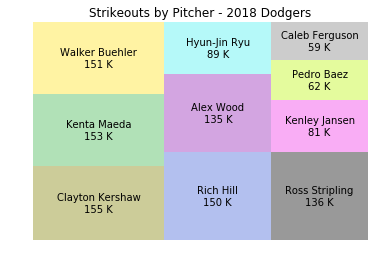

In [843]:
import squarify
top10 = dodgers.sort_values(by=['K'], ascending=False).iloc[:10,:]
# Change color
squarify.plot(sizes=top10.K, label=top10.Name + '\n' + top10.K.astype(str) + ' K',
              color=['#808000', '#3cb44b', '#ffe119', '#4363d8', '#000000',
                     '#911eb4', '#46f0f0', '#f032e6', '#bcf60c', '#808080'],
              alpha=.4 )
plt.axis('off')
plt.title('Strikeouts by Pitcher - 2018 Dodgers', fontsize=12)
plt.show()